<a href="https://colab.research.google.com/github/Lanaanvar/Deep-Learning/blob/main/Digital_Image_Lab.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Shape: (512, 512, 3)
Size: 786432
Data type: uint8
Compression Ratio: 19.475975173661062


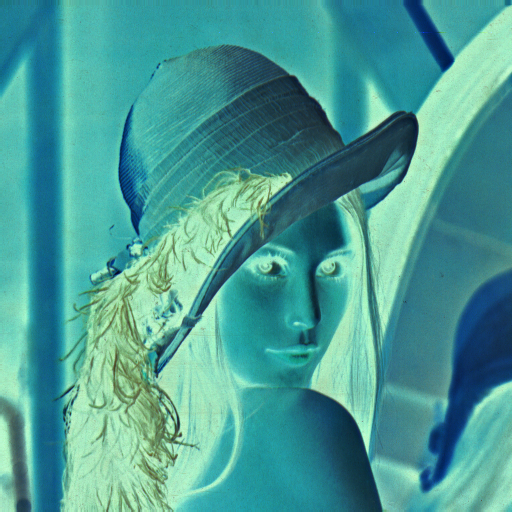

In [1]:
import cv2
import numpy as np
import os
from google.colab.patches import cv2_imshow

# a. Read an image
img = cv2.imread('lena_img.png', cv2.IMREAD_COLOR)

# b. Get image information
print("Shape:", img.shape)
print("Size:", img.size)
print("Data type:", img.dtype)

# c. Compression ratio (original vs saved)
cv2.imwrite('compressed.jpg', img, [cv2.IMWRITE_JPEG_QUALITY, 50])
original_size = os.path.getsize('lena_img.png')
compressed_size = os.path.getsize('compressed.jpg')
print("Compression Ratio:", original_size / compressed_size)

# d. Negative of an image
negative = 255 - img
cv2_imshow(negative)

/tmp/ipython-input-2972314831.py:4: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(gray.ravel(), 256, [0, 256])


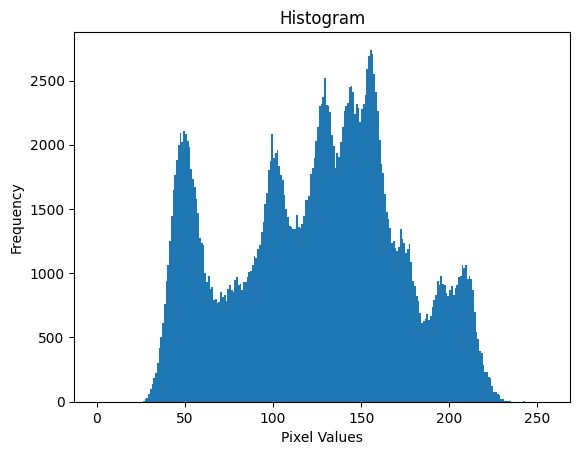

In [2]:
import matplotlib.pyplot as plt

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
plt.hist(gray.ravel(), 256, [0, 256])
plt.title('Histogram')
plt.xlabel('Pixel Values')
plt.ylabel('Frequency')
plt.show()


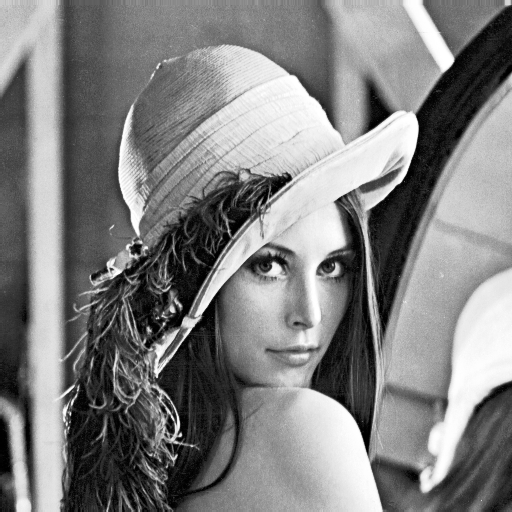

In [3]:
equalized = cv2.equalizeHist(gray)
cv2_imshow(equalized)

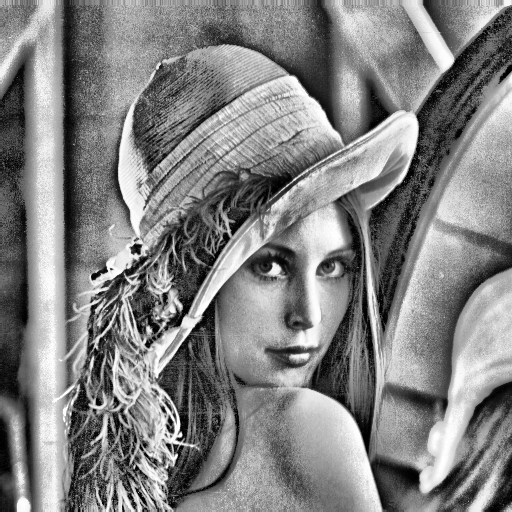

In [4]:
from skimage import exposure
from google.colab.patches import cv2_imshow

local_eq = exposure.equalize_adapthist(gray/255, clip_limit=0.03)
cv2_imshow((local_eq * 255).astype('uint8'))

Displaying: Original


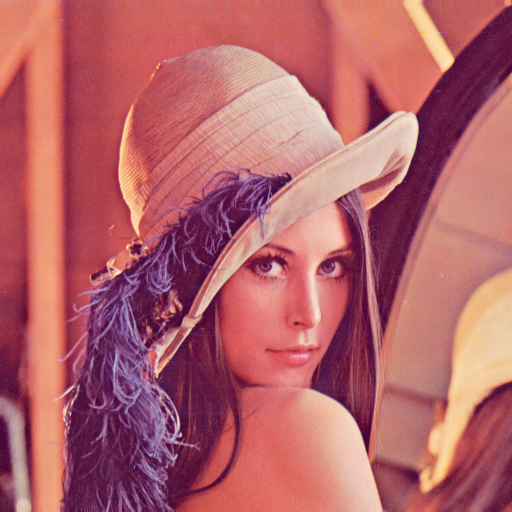

Displaying: Brightened


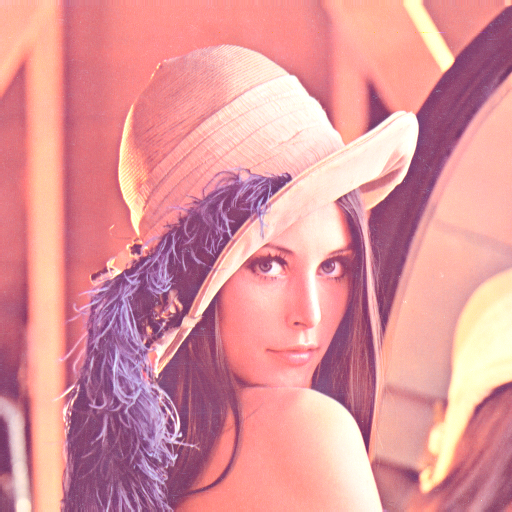

Displaying: Contrast Enhanced


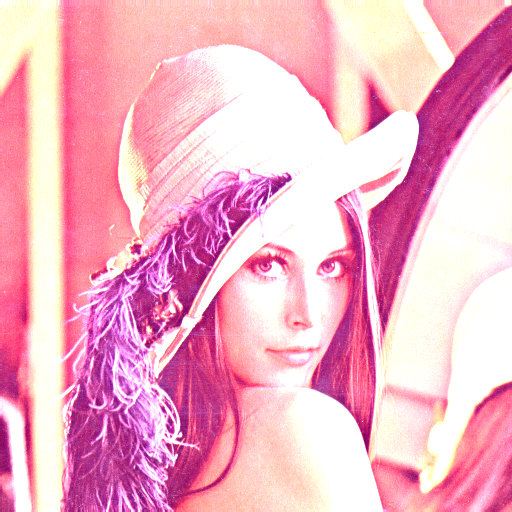

Displaying: Complement


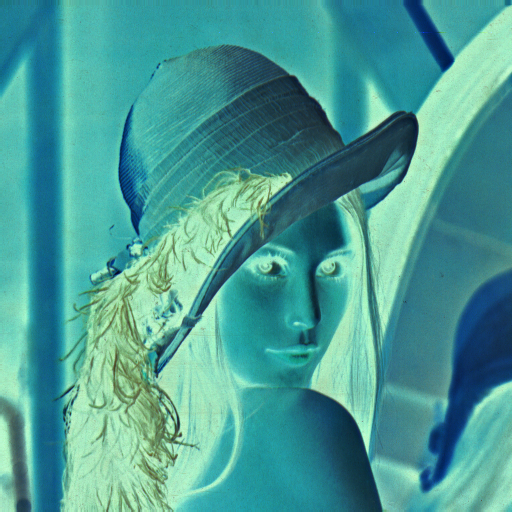

Displaying: Binary


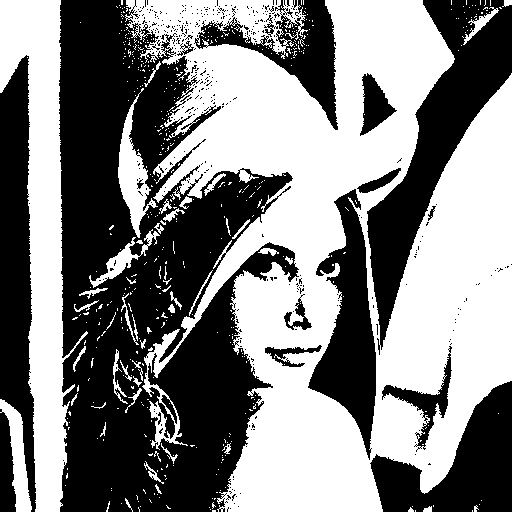

Displaying: Brightness Slicing


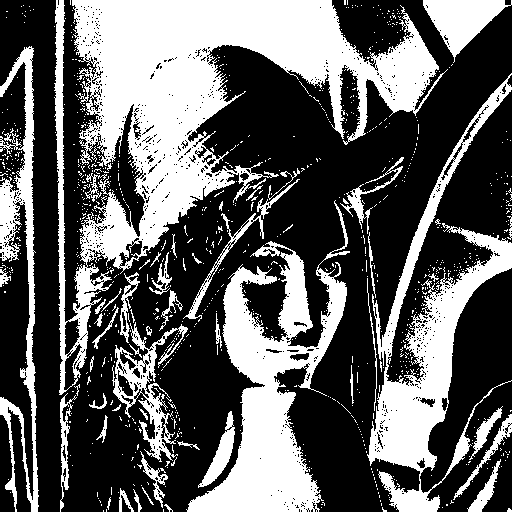

Displaying: Low-Pass


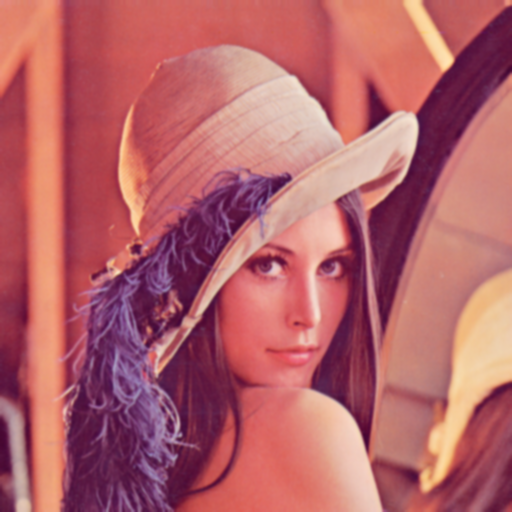

Displaying: High-Pass


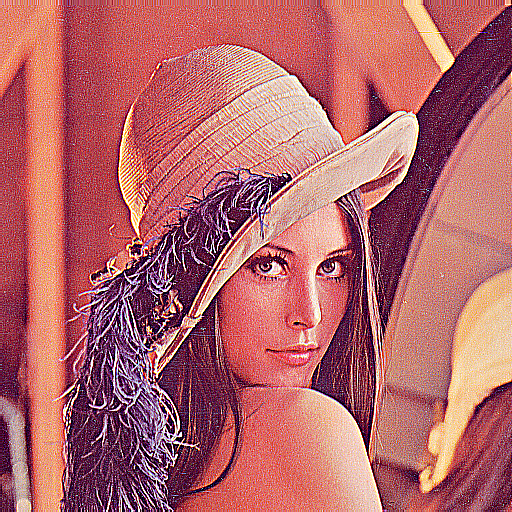

In [5]:
# a. Brightness enhancement
bright = cv2.convertScaleAbs(img, alpha=1, beta=50)

# b. Contrast enhancement
contrast = cv2.convertScaleAbs(img, alpha=2, beta=0)

# c. Complement of an image
complement = cv2.bitwise_not(img)

# d. Bi-level contrast enhancement
_, binary = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)

# e. Brightness slicing
brightness_slice = cv2.inRange(gray, 100, 150)

# f. Low-pass filtering (blurring)
low_pass = cv2.GaussianBlur(img, (5, 5), 0)

# g. High-pass filtering (sharpening)
kernel = np.array([[-1, -1, -1],
                   [-1,  9, -1],
                   [-1, -1, -1]])
high_pass = cv2.filter2D(img, -1, kernel)

# Show all
titles = ['Original', 'Brightened', 'Contrast Enhanced', 'Complement',
          'Binary', 'Brightness Slicing', 'Low-Pass', 'High-Pass']
images = [img, bright, contrast, complement, binary, brightness_slice, low_pass, high_pass]

for i in range(len(images)):
    print(f"Displaying: {titles[i]}")
    cv2_imshow(images[i])

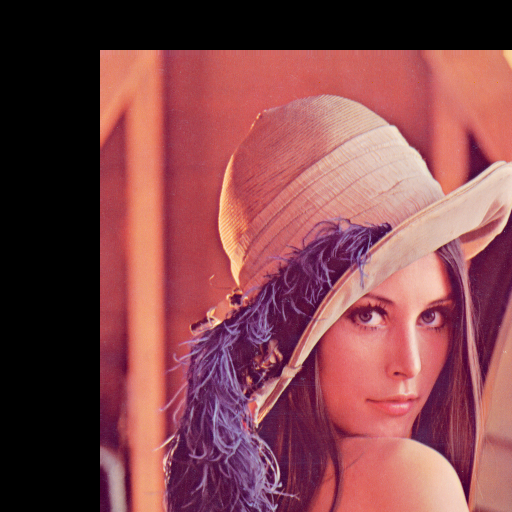

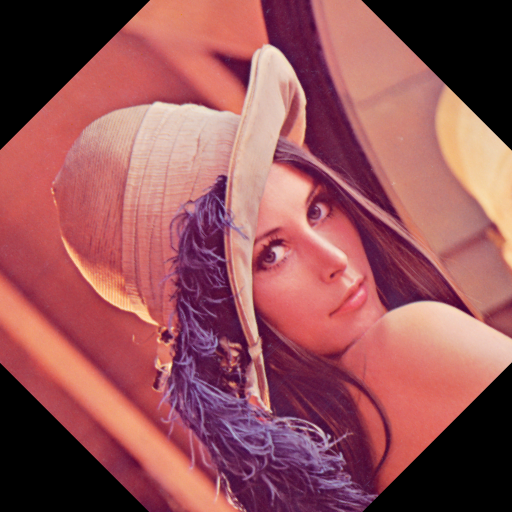

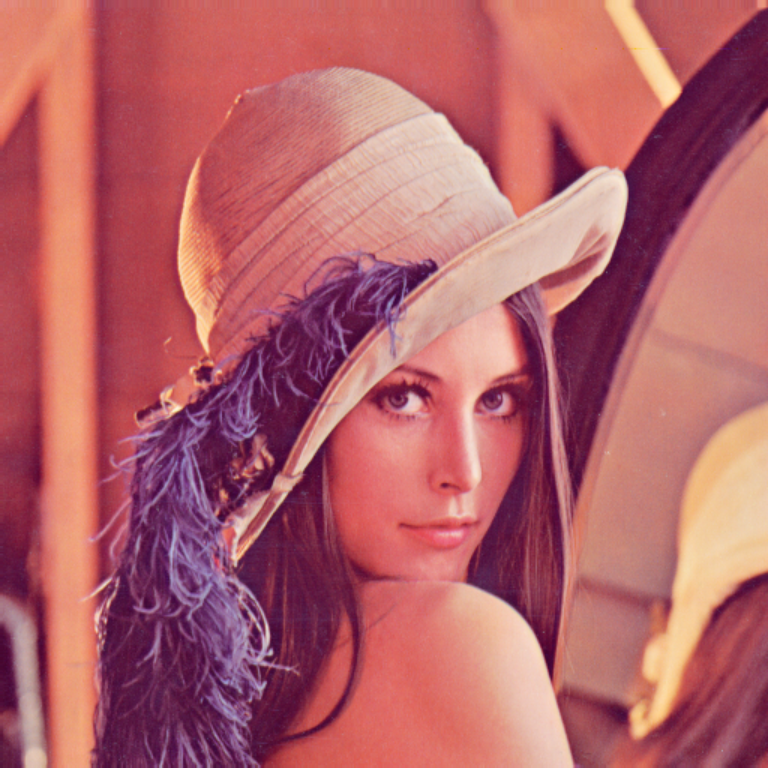

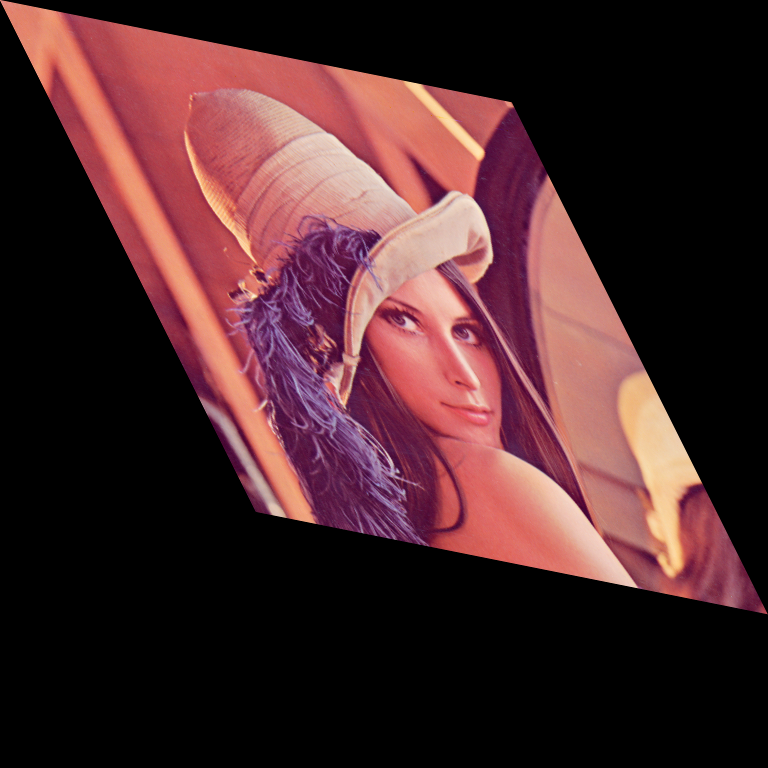

In [7]:
from google.colab.patches import cv2_imshow
import cv2
import numpy as np

(h, w) = img.shape[:2]

# a. Translation
M = np.float32([[1, 0, 100], [0, 1, 50]])  # shift right 100, down 50
translated = cv2.warpAffine(img, M, (w, h))

# b. Rotation
center = (w // 2, h // 2)
M = cv2.getRotationMatrix2D(center, 45, 1.0)
rotated = cv2.warpAffine(img, M, (w, h))

# c. Scaling
scaled = cv2.resize(img, None, fx=1.5, fy=1.5, interpolation=cv2.INTER_LINEAR)

# d. Skewing
M = np.float32([[1, 0.5, 0], [0.2, 1, 0]])
skewed = cv2.warpAffine(img, M, (int(w*1.5), int(h*1.5)))

# Show transformations
cv2_imshow(translated)
cv2_imshow(rotated)
cv2_imshow(scaled)
cv2_imshow(skewed)
# cv2.waitKey(0) # Not needed with cv2_imshow
# cv2.destroyAllWindows() # Not needed with cv2_imshow

## SET 2

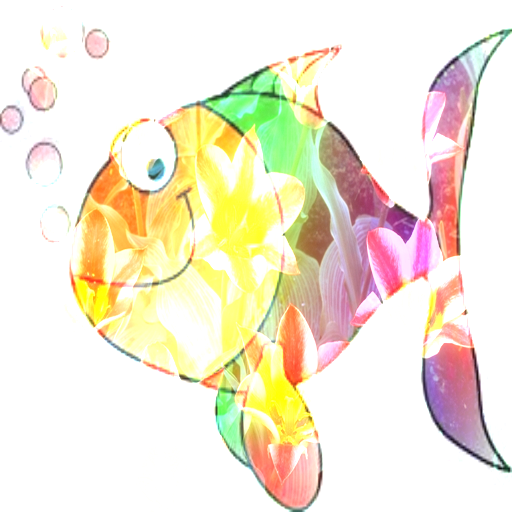

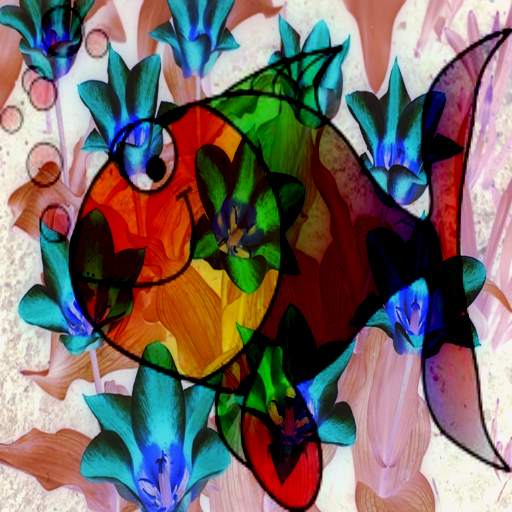

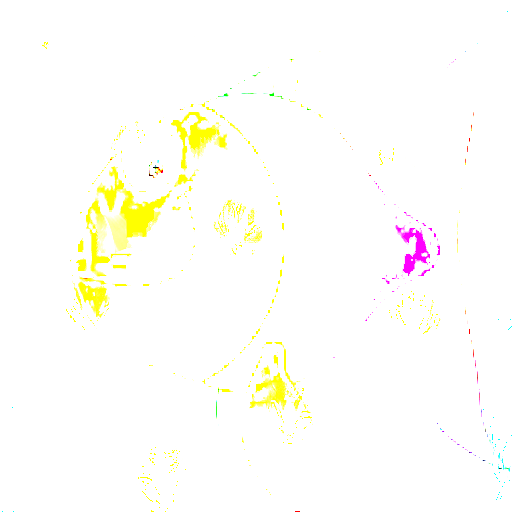

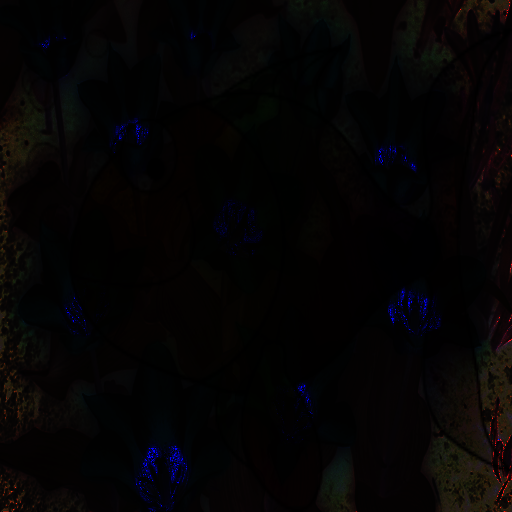

In [10]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow # Import cv2_imshow

img1 = cv2.imread('image1.jpg')
img2 = cv2.imread('image2.png')

# Check if images were loaded successfully
if img1 is None:
    print("Error: image1.jpg not found or could not be loaded.")
elif img2 is None:
    print("Error: image2.jpg not found or could not be loaded.")
else:
    img1 = cv2.resize(img1, (512, 512))
    img2 = cv2.resize(img2, (512, 512))

    add = cv2.add(img1, img2)
    sub = cv2.subtract(img1, img2)
    mul = cv2.multiply(img1, img2)
    div = cv2.divide(img1, img2)

    # Use cv2_imshow instead of cv2.imshow
    cv2_imshow(add)
    cv2_imshow(sub)
    cv2_imshow(mul)
    cv2_imshow(div)
    # cv2.waitKey(0) # Not needed with cv2_imshow
    # cv2.destroyAllWindows() # Not needed with cv2_imshow

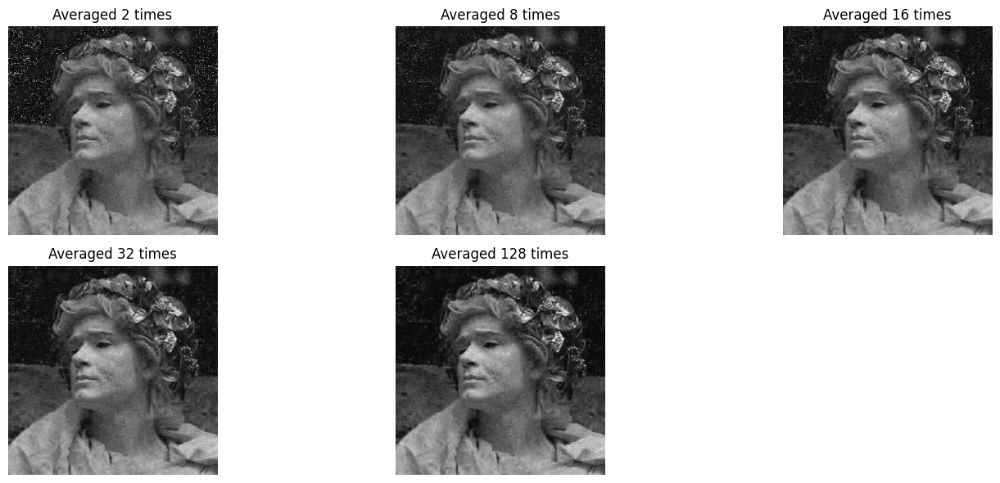

In [11]:
import matplotlib.pyplot as plt

img = cv2.imread('noisy image.jpg', cv2.IMREAD_GRAYSCALE)

def average_reduction(image, n):
    avg_img = np.zeros_like(image, dtype=np.float32)
    for _ in range(n):
        noise = image + np.random.normal(0, 10, image.shape).astype('uint8')
        avg_img += noise
    return (avg_img / n).astype('uint8')

averages = [2, 8, 16, 32, 128]
results = [average_reduction(img, n) for n in averages]

plt.figure(figsize=(15, 6))
for i, n in enumerate(averages):
    plt.subplot(2, 3, i+1)
    plt.imshow(results[i], cmap='gray')
    plt.title(f"Averaged {n} times")
    plt.axis('off')
plt.tight_layout()
plt.show()


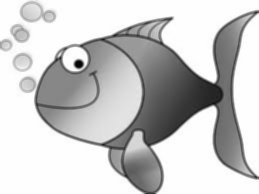

Displayed: Averaging


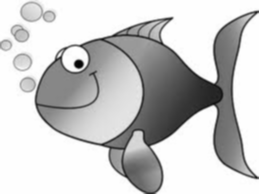

Displayed: Gaussian


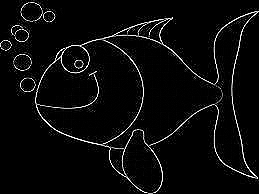

Displayed: Laplacian


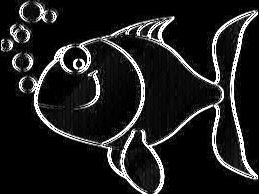

Displayed: Sobel X


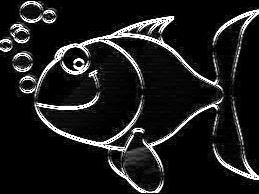

Displayed: Sobel Y


In [13]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow # Import cv2_imshow

def apply_filter(img, kernel):
    return cv2.filter2D(img, -1, kernel)

img = cv2.imread('image1.jpg', 0)

# Example filters
kernels = {
    "Averaging": np.ones((3, 3), np.float32) / 9,
    "Gaussian": cv2.getGaussianKernel(3, 0) @ cv2.getGaussianKernel(3, 0).T,
    "Laplacian": np.array([[0, 1, 0], [1, -4, 1], [0, 1, 0]]),
}

# Apply and display standard filters
for name, kernel in kernels.items():
    filtered = apply_filter(img, kernel)
    cv2_imshow(filtered)
    print(f"Displayed: {name}")

# Apply and display Sobel filters separately
sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=3)
abs_sobelx = cv2.convertScaleAbs(sobelx)
cv2_imshow(abs_sobelx)
print("Displayed: Sobel X")

sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=3)
abs_sobely = cv2.convertScaleAbs(sobely)
cv2_imshow(abs_sobely)
print("Displayed: Sobel Y")

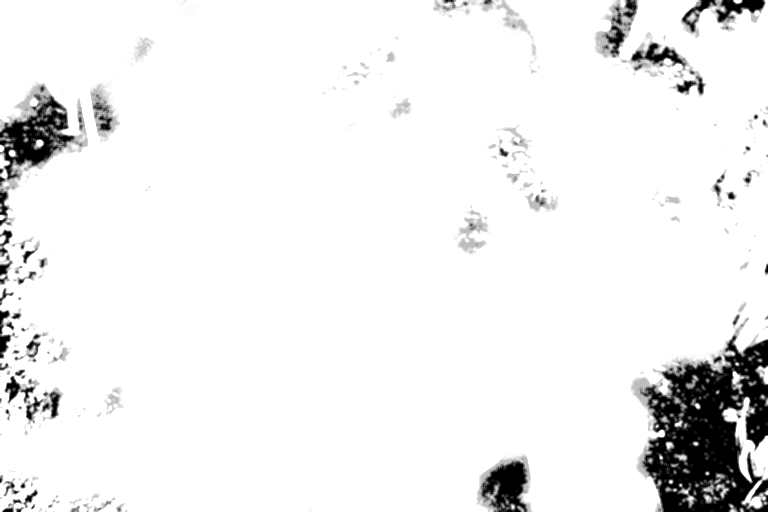

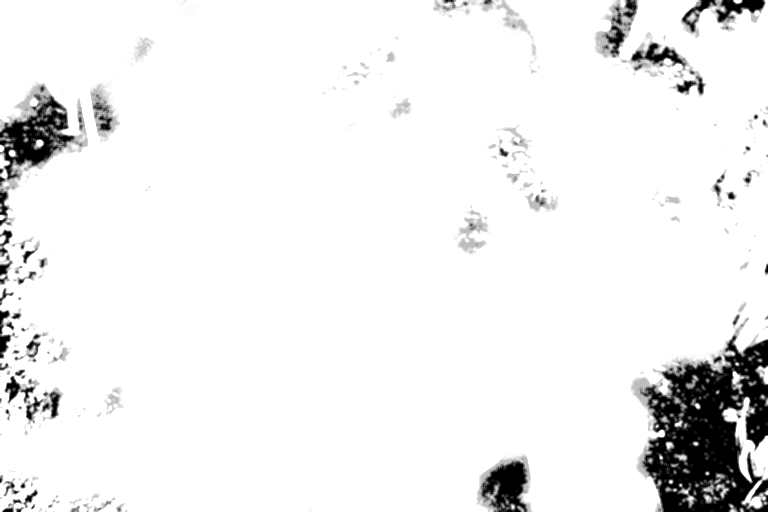

In [19]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow # Import cv2_imshow

def read_kernel(file_path):
    with open(file_path, 'r') as f:
        lines = f.readlines()
        size = int(lines[0].strip())
        kernel = [list(map(float, line.strip().split())) for line in lines[1:]]
        return np.array(kernel, dtype=np.float32)

def convolve(img, kernel):
    return cv2.filter2D(img, -1, kernel)

def correlate(img, kernel):
    flipped = np.flipud(np.fliplr(kernel))
    return cv2.filter2D(img, -1, flipped)

img = cv2.imread('image2.png', cv2.IMREAD_GRAYSCALE)

if img is None:
    print("Error: image2.png not found or could not be loaded.")
else:
    # Assuming 'kernel.txt' is available and correctly formatted
    try:
        kernel = read_kernel('kernel.txt')
        convolved = convolve(img, kernel)
        correlated = correlate(img, kernel)

        cv2_imshow(convolved)
        cv2_imshow(correlated)
        # cv2.waitKey(0) # Not needed with cv2_imshow
        # cv2.destroyAllWindows() # Not needed with cv2_imshow
    except FileNotFoundError:
        print("Error: kernel.txt not found.")
    except Exception as e:
        print(f"An error occurred while processing the kernel or images: {e}")